<h2><font color='green'>Case study 2 on Soyabean dataset

<h2>Business problem

This Code is from https://medium.com/@ravitejarj25/image-classification-on-soybean-dataset-with-cnn-376220e6e34f


The dataset contains 10 types of soyabean leafs
382 leaf images
we have to trian on these images and predict on these images


we have to train these images 
and predict on these images 


- Healthy  -  8
- Bacterial Blight -  51
- Copper Phytotoxicity - 23
- Mosaic Virus - 22 
- Downy Mildew - 33
- Powdery Mildew - 74
- Brown Spot - 13
- Rust and target spot -  32
- Rust -  64
- Southern blight -  62

There are 10 leaf types

so we have to train these leaf types images
there are 383 images so we have to train these images

and then we have to predict class labels of these images

In [1]:
'''Importing required libraries '''

import numpy as np
import glob
import matplotlib.pyplot as plot
import tensorflow as tf
import datetime
import keras
import pandas as pd
import seaborn as sns
%matplotlib inline
import cv2
import os
from random import randint
from pathlib import Path
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from keras.utils import to_categorical
from keras.models import Model
from sklearn.utils import shuffle
from keras.models import Sequential
import tensorflow.keras.models as Models
from keras.layers import Conv2D, MaxPooling2D, Dense, Dropout, Input, Flatten, SeparableConv2D, Activation
import tensorflow.keras.optimizers as Optimizer
import tensorflow.keras.layers as Layers
from keras.utils import np_utils
from keras.layers.normalization import BatchNormalization
from keras import optimizers as Optimizers
from keras.optimizers import Adam, SGD
from keras.layers import Dense,GlobalAveragePooling2D
import tensorflow as tf

Using TensorFlow backend.


In [2]:
#''' Mounting google drive for loading dataset '''

#from google.colab import drive
#drive.mount('/content/drive')

In [3]:
# we defined train path and test path of soyabean dataset

#train_path = '/content/drive/My Drive/Newdataset/Soyabean-Original/'

train_path = 'Soyabean-Original/'

In [4]:
''' these are used to store images and class labels '''

images_train = []
labels_train = []
label = 0

In [5]:
#Cropping lenghts
y = 500
x = 500
h = 3200
w = 3200

<h2><font color='green'>Loading the dataset

In [15]:
'''in this we load the dataset'''
for directories in os.listdir(train_path):
    #print(directories)
    if directories == 'Healthy':
        label = 0
    elif directories == 'Bacterial Blight':
        label = 1
    elif directories == 'Copper Phytotoxicity':
        label = 2
    elif directories == 'Mosaic Virus':
        label = 3
    elif directories == 'Downy Mildew':
        label = 4
    elif directories == 'Powdery Mildew':
        label = 5
    elif directories == 'Brown Spot':
        label = 6
    elif directories == 'Rust and Target Spot':
        label = 7
    elif directories == 'Rust':
        label = 8
    elif directories == 'Southern Blight':
        label = 9
    
    for img in os.listdir(train_path + directories):
        image = cv2.imread(train_path + directories + '/' + img) #imread is used to read the image files
        image = image[y:y+h, x:x+w] #Cropping the images
        image = cv2.resize(image,(150, 150)) #we are reszing the images height and width
        images_train.append(image) #appending images to images_train
        labels_train.append(label) #appending image labels to labels_train
        Images_train, Labels_train = shuffle(images_train, labels_train) #shuffling the data

In [16]:
X = np.array(Images_train)/255
y = np.array(Labels_train)

#'''' we are reshaping the data'''
y = y.reshape(y.shape[0], 1)
y = np_utils.to_categorical(y, 10)

In [17]:
print('Train images shape:',X.shape)
print('Labels shape:',y.shape)

Train images shape: (382, 150, 150, 3)
Labels shape: (382, 10)


In [18]:
'''we are splitting our dataset'''

from sklearn.model_selection import train_test_split

x_train_2, x_test_2, y_train_2, y_test_2 = train_test_split(Images_train, Labels_train, test_size=0.2,stratify=Labels_train, random_state=0)

In [19]:
'''we can see how many images in each class in training data'''
for i in range(10):
    print("class",i, "has ",y_train_2.count(i),"images")

class 0 has  6 images
class 1 has  41 images
class 2 has  18 images
class 3 has  18 images
class 4 has  26 images
class 5 has  59 images
class 6 has  10 images
class 7 has  26 images
class 8 has  51 images
class 9 has  50 images


In [20]:
'''we can see how many images in each class in test data'''
for i in range(10):
    print("class",i, "has ",y_test_2.count(i),"images")

class 0 has  2 images
class 1 has  10 images
class 2 has  5 images
class 3 has  4 images
class 4 has  7 images
class 5 has  15 images
class 6 has  3 images
class 7 has  6 images
class 8 has  13 images
class 9 has  12 images


- we splitted data into train and test.
- we can see how many images in each class in train and test data

In [21]:
'''splitting the data into train and test'''

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2,stratify=y, random_state=0)

<h1><font color='green'> EDA

In [22]:
''' so dataset contain all images i created a datast which has how many images in each class '''
'''and stored in df'''

data = [[ 'Healthy', 8], [ 'Bacterial Blight', 51], [ 'Copper Phytotoxicity', 23],
        ['Mosaic Virus', 22], ['Downy Mildew', 33], ['Powdery Mildew', 74], 
        ['Brown Spot',13], ['Rust and target spot', 32], [ 'Rust', 64], [ 'Southern blight', 62],]

df = pd.DataFrame(data, columns = ['leaftype', 'total']) 

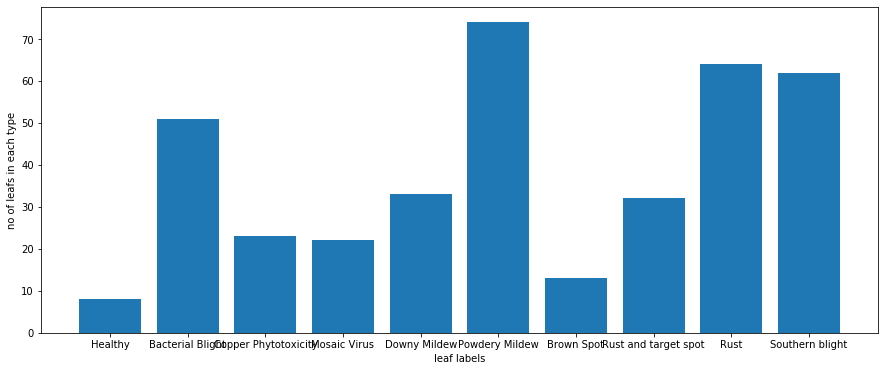

In [23]:
''' we are plotting the df dataset  '''
''' which has how many images in each class labels '''

plt.figure(figsize=(15,6))
plt.bar(df['leaftype'], df['total']) 
plt.xlabel("leaf labels") 
plt.ylabel("no of leafs in each type") 
plt.show() 

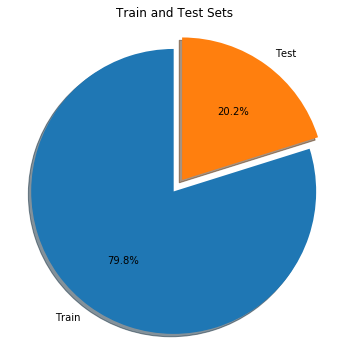

In [24]:
# plotting a pie chart which demonstrates train and test sets
labels = 'Train', 'Test'
sizes = [len(x_train), len(x_test)]
explode = (0, 0.1)

fig, ax = plt.subplots(figsize=(6, 6))
ax.pie(sizes, explode=explode, labels=labels, autopct='%0.1f%%', shadow=True, startangle=90)
ax.axis('equal')
ax.set_title('Train and Test Sets')

plt.show()

we are loading the images and reshaping the images
and also appending the images into images_train
and also appending images class labels into labels_train

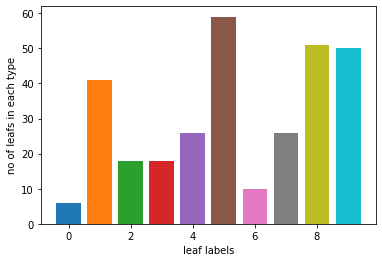

In [25]:
for i in range(10):
    plt.bar(i,y_train_2.count(i))
    plt.xlabel("leaf labels") 
    plt.ylabel("no of leafs in each type") 
plt.show() 

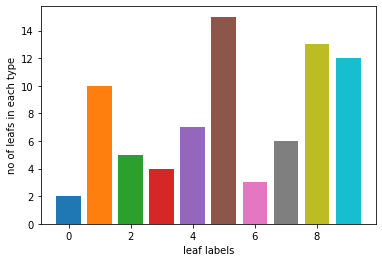

In [26]:
for i in range(10):
    plt.bar(i,y_test_2.count(i))
    plt.xlabel("leaf labels") 
    plt.ylabel("no of leafs in each type") 
plt.show() 

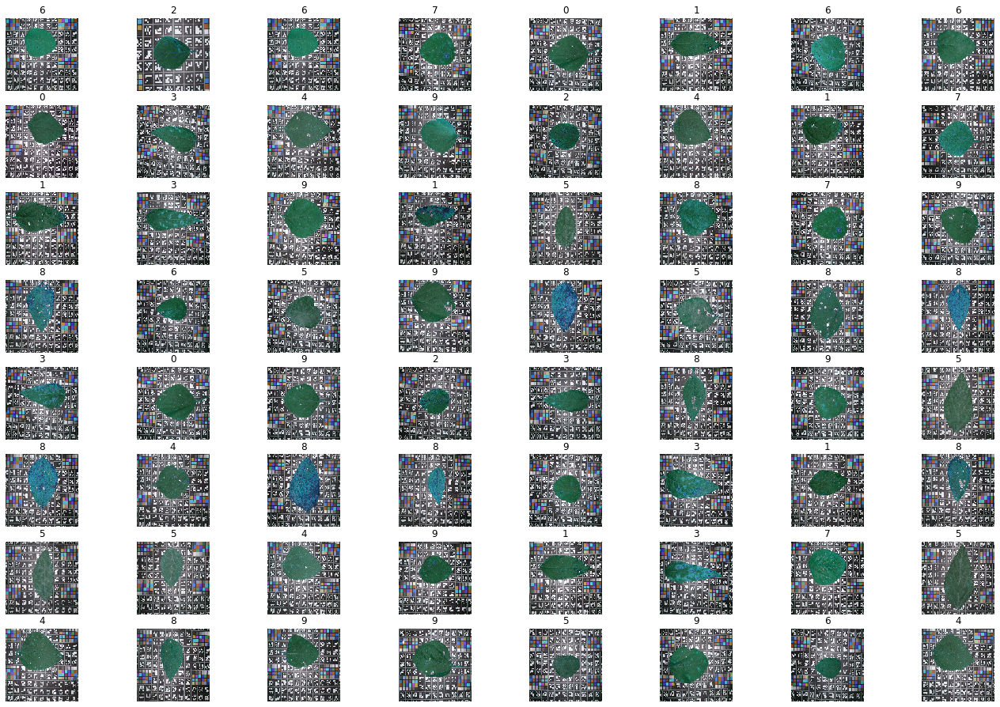

In [27]:
'''view sample images of each labels'''

f,ax = plot.subplots(8,8) 
f.subplots_adjust(0,0,3,3)
for i in range(0,8,1):
    for j in range(0,8,1):
        rnd_number = randint(0,len(Images_train))
        ax[i,j].imshow(Images_train[rnd_number]) #''' to show each image'''
        ax[i,j].set_title(Labels_train[rnd_number]) #'''to show labels for each images'''
        ax[i,j].axis('off')

In [28]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# https://www.pyimagesearch.com/2019/07/08/keras-imagedatagenerator-and-data-augmentation
#for Image data augmentation on trainig data

datagen_tr = ImageDataGenerator(featurewise_center=False, samplewise_center=False, 
                                 featurewise_std_normalization=False, samplewise_std_normalization=False,
                                 zca_whitening=False, zca_epsilon=1e-06,
                                 rotation_range=False, width_shift_range=0, height_shift_range=0,
                                 shear_range=0, zoom_range=0.2, channel_shift_range=0, 
                                 fill_mode='nearest', cval=0, horizontal_flip=True,vertical_flip=True, 
                                 rescale=None, preprocessing_function=None, data_format=None, validation_split=0)


In [29]:
#https://stackoverflow.com/questions/43547402/how-to-calculate-f1-macro-in-keras

from keras import backend as K

def f1(y_true, y_pred):
    def recall(y_true, y_pred):
        """Recall metric.

        Only computes a batch-wise average of recall.

        Computes the recall, a metric for multi-label classification of
        how many relevant items are selected.
        """
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

    def precision(y_true, y_pred):
        """Precision metric.

        Only computes a batch-wise average of precision.

        Computes the precision, a metric for multi-label classification of
        how many selected items are relevant.
        """
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision
    precision = precision(y_true, y_pred)
    recall = recall(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))


<h2><font color='green'>Model 1

<h2><font color='green'>Tensorboard

In [ ]:
#https://www.tensorflow.org/tensorboard/get_started
# Load the TensorBoard notebook extension

%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
'''We are using TensorBoard, we can see train and test accuracy and loss'''
from datetime import datetime

logdir = "logs/scalars1/" + datetime.now().strftime("%Y%m%d-%H%M%S")

In [ ]:
from keras.regularizers import l2
from keras import regularizers
model1 = Models.Sequential()

model1.add(Layers.Conv2D(32, kernel_size=(3,3), activation='relu', input_shape=(150,150,3)))
model1.add(Layers.BatchNormalization())
model1.add(Layers.MaxPooling2D((2, 2)))

model1.add(Layers.Conv2D(64, kernel_size=(3,3), activation='relu'))
model1.add(Layers.BatchNormalization())
model1.add(Layers.MaxPooling2D((2, 2)))
model1.add(Layers.Dropout(rate=0.25))

model1.add(Layers.Conv2D(128, kernel_size=(3,3), activation='relu'))
model1.add(Layers.BatchNormalization())
model1.add(Layers.MaxPooling2D((2, 2)))
model1.add(Layers.Dropout(rate=0.25))

model1.add(Layers.Conv2D(256, kernel_size=(3,3), activation='relu'))
model1.add(Layers.BatchNormalization())
model1.add(Layers.MaxPooling2D((2, 2)))
model1.add(Layers.Dropout(rate=0.25))

model1.add(Layers.Flatten())

model1.add(Layers.Dense(64,activation='relu'))
model1.add(Layers.BatchNormalization())
model1.add(Layers.Dropout(rate=0.5))

model1.add(Layers.Dense(10,activation='softmax'))

In [ ]:
''' compiling the model '''
model1.compile(optimizer=Optimizer.Adam(lr=0.0001), 
               loss='categorical_crossentropy', 
               metrics=[f1])

In [ ]:
check_point = keras.callbacks.ModelCheckpoint("model_1", monitor="val_loss", mode= "min", verbose= 1, save_best_only=True)

tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir)

cb = [tensorboard_callback, check_point]

In [ ]:
model1_history = model1.fit_generator(datagen_tr.flow(x_train, y_train, batch_size= 6),
                                      steps_per_epoch=len(x_train) / 6, epochs = 200,
                                      validation_data=(x_test, y_test),
                                      callbacks=cb)

Epoch 1/200
77/50 [=============================================] - 0s 992us/sample - loss: 7.5542 - f1: 0.1667

Epoch 00001: val_loss improved from inf to 6.98710, saving model to model_1
51/50 [==============================] - 3s 62ms/step - loss: 2.5104 - f1: 0.1327 - val_loss: 6.9871 - val_f1: 0.1667
Epoch 2/200
77/50 [=============================================] - 0s 955us/sample - loss: 12.1173 - f1: 0.1667

Epoch 00002: val_loss did not improve from 6.98710
51/50 [==============================] - 1s 28ms/step - loss: 2.1440 - f1: 0.2771 - val_loss: 11.2651 - val_f1: 0.1667
Epoch 3/200
77/50 [=============================================] - 0s 960us/sample - loss: 17.0589 - f1: 0.1667

Epoch 00003: val_loss did not improve from 6.98710
51/50 [==============================] - 2s 31ms/step - loss: 1.9947 - f1: 0.3183 - val_loss: 16.0290 - val_f1: 0.1667
Epoch 4/200
77/50 [=============================================] - 0s 968us/sample - loss: 18.9210 - f1: 0.1667

Epoch 00004

In [ ]:
'''we can see accuracy and loss'''

%tensorboard --logdir logs/scalars1

Reusing TensorBoard on port 6006 (pid 8908), started 0:00:32 ago. (Use '!kill 8908' to kill it.)

<img src=1-1.png>

<img src=1-2.png>

<img src=1-3.png>

<img src=1-4.png>

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score

x_pred = model1.predict_classes(x_test, verbose=1)
x_pred = np.array(x_pred)
x_pred = x_pred.reshape(x_pred.shape[0], 1)
x_pred = np_utils.to_categorical(x_pred, 10)

f1_score(y_test, x_pred, average='micro')

77/77 [==============================] - 0s 620us/sample


0.6753246753246753

In [ ]:
score1 = model1.evaluate(x_train, y_train, verbose=0) 
print('Train accuracy:', score1[1])

score2 = model1.evaluate(x_test, y_test, verbose=0) 
print('Test accuracy:', score2[1])

Train accuracy: 0.90826637
Test accuracy: 0.6953103


In [ ]:
#https://scikit-plot.readthedocs.io/en/stable/Quickstart.html

! pip install -q scikit-plot

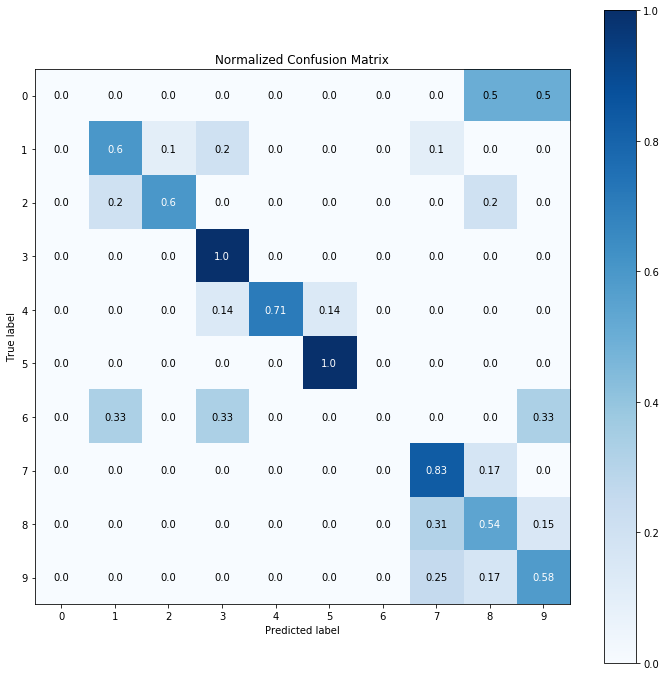

In [ ]:
import scikitplot as skplt

skplt.metrics.plot_confusion_matrix(y_test.argmax(axis=1), x_pred.argmax(axis=1), 
                                    figsize=(12,12), normalize=True)

- Model 1 is overfitting on train data
- and not good on test dataset
- now adding regularization to this model

<h2><font color='green'>Model 2

<h2><font color='green'>Tensorboard

In [ ]:
#https://www.tensorflow.org/tensorboard/get_started
# Load the TensorBoard notebook extension

%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
'''We are using TensorBoard, we can see train and test accuracy and loss'''
from datetime import datetime

logdir = "logs/scalars2/" + datetime.now().strftime("%Y%m%d-%H%M%S")

In [ ]:
from keras.regularizers import l2
from keras import regularizers
model2 = Models.Sequential()

model2.add(Layers.Conv2D(32, kernel_size=(3,3), activation='relu', kernel_regularizer=l2(0.01), input_shape=(150,150,3)))
model2.add(Layers.BatchNormalization())
model2.add(Layers.MaxPooling2D((2, 2)))

model2.add(Layers.Conv2D(64, kernel_size=(3,3), activation='relu', kernel_regularizer=l2(0.01)))
model2.add(Layers.BatchNormalization())
model2.add(Layers.MaxPooling2D((2, 2)))
model2.add(Layers.Dropout(rate=0.25))

model2.add(Layers.Conv2D(128, kernel_size=(3,3), activation='relu', kernel_regularizer=l2(0.01)))
model2.add(Layers.BatchNormalization())
model2.add(Layers.MaxPooling2D((2, 2)))
model2.add(Layers.Dropout(rate=0.25))

model2.add(Layers.Conv2D(256, kernel_size=(3,3), activation='relu', kernel_regularizer=l2(0.01)))
model2.add(Layers.BatchNormalization())
model2.add(Layers.MaxPooling2D((2, 2)))
model2.add(Layers.Dropout(rate=0.25))

model2.add(Layers.Flatten())

model2.add(Layers.Dense(64,activation='relu',kernel_regularizer=l2(0.01)))
model2.add(Layers.BatchNormalization())
model2.add(Layers.Dropout(rate=0.5))

model2.add(Layers.Dense(10,activation='softmax'))

In [ ]:
''' compiling the model '''
model2.compile(optimizer=Optimizer.Adam(lr=0.0001), 
               loss='categorical_crossentropy', 
               metrics=[f1])

In [ ]:
check_point = keras.callbacks.ModelCheckpoint("model_2", monitor="val_loss", mode= "min", verbose= 1, save_best_only=True)

tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir)

cb = [tensorboard_callback, check_point]

In [ ]:
model2_history = model2.fit_generator(datagen_tr.flow(x_train, y_train, batch_size= 6),
                                      steps_per_epoch=len(x_train) / 6, epochs = 200,
                                      validation_data=(x_test, y_test),
                                      callbacks=cb)

Epoch 1/200
77/50 [=============================================] - 1s 10ms/sample - loss: 8.7545 - f1: 0.1998

Epoch 00001: val_loss improved from inf to 8.39097, saving model to model_2
51/50 [==============================] - 9s 175ms/step - loss: 6.8470 - f1: 0.1267 - val_loss: 8.3910 - val_f1: 0.1998
Epoch 2/200
77/50 [=============================================] - 0s 2ms/sample - loss: 10.1247 - f1: 0.1984

Epoch 00002: val_loss did not improve from 8.39097
51/50 [==============================] - 2s 32ms/step - loss: 6.4491 - f1: 0.2078 - val_loss: 9.6338 - val_f1: 0.1984
Epoch 3/200
77/50 [=============================================] - 0s 2ms/sample - loss: 10.8019 - f1: 0.0412

Epoch 00003: val_loss did not improve from 8.39097
51/50 [==============================] - 2s 36ms/step - loss: 6.3764 - f1: 0.2283 - val_loss: 10.2832 - val_f1: 0.0412
Epoch 4/200
77/50 [=============================================] - 0s 2ms/sample - loss: 12.7407 - f1: 0.0385

Epoch 00004: val_l

In [ ]:
'''we can see accuracy and loss'''

%tensorboard --logdir logs/scalars2

<img src=2-1.png>

<img src=2-2.png>

<img src=2-3.png>

<img src=2-4.png>

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score

x_pred = model2.predict_classes(x_test, verbose=1)
x_pred = np.array(x_pred)
x_pred = x_pred.reshape(x_pred.shape[0], 1)
x_pred = np_utils.to_categorical(x_pred, 10)

f1_score(y_test, x_pred, average='micro')

77/77 [==============================] - 0s 730us/sample


0.7142857142857143

In [ ]:
score1 = model2.evaluate(x_train, y_train, verbose=0) 
print('Train accuracy:', score1[1])

score2 = model2.evaluate(x_test, y_test, verbose=0) 
print('Test accuracy:', score2[1])

Train accuracy: 0.842154
Test accuracy: 0.7491255


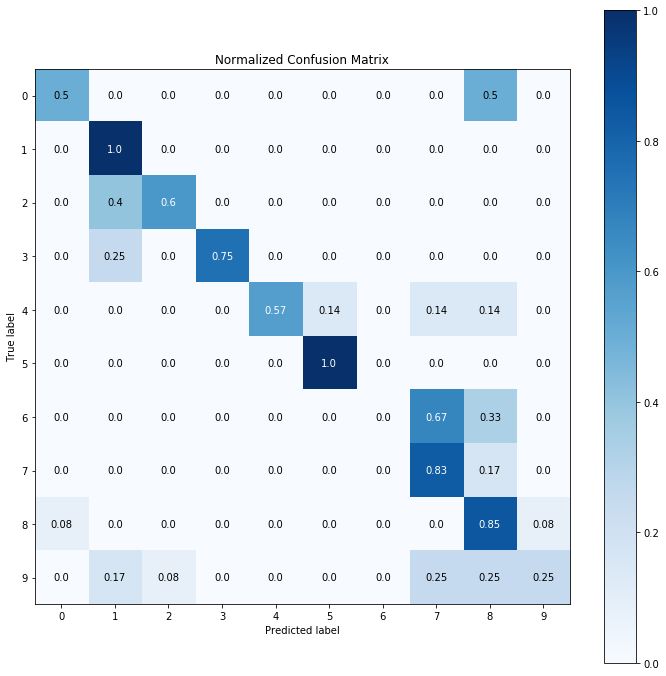

In [ ]:
import scikitplot as skplt

skplt.metrics.plot_confusion_matrix(y_test.argmax(axis=1), x_pred.argmax(axis=1), 
                                    figsize=(12,12), normalize=True)

- After using regularization (l2) the model 2 is not overfitting 
- and the model is pretty good on train and test dataset.
- now we are adding the calculated weights to this model.

<h2><font color='green'>Model 3

In [ ]:
#https://scikit-learn.org/stable/modules/generated/sklearn.utils.class_weight.compute_class_weight.html
from sklearn.utils import class_weight

class_w = class_weight.compute_class_weight('balanced',np.unique(Labels_train), Labels_train)'''we are calculating the class weights'''

In [ ]:
'''printing the each class weights'''
class_w

array([4.775     , 0.74901961, 1.66086957, 1.73636364, 1.15757576,
       0.51621622, 2.93846154, 1.19375   , 0.596875  , 0.61612903])

In [ ]:
'''making dictionary class weights'''
new_weights = dict(enumerate(class_w))

In [ ]:
new_weights

{0: 4.775,
 1: 0.7490196078431373,
 2: 1.6608695652173913,
 3: 1.7363636363636363,
 4: 1.1575757575757575,
 5: 0.5162162162162162,
 6: 2.9384615384615387,
 7: 1.19375,
 8: 0.596875,
 9: 0.6161290322580645}

<h2><font color='green'>Tensorboard

In [ ]:
#https://www.tensorflow.org/tensorboard/get_started
# Load the TensorBoard notebook extension

%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
'''We are using TensorBoard, we can see train and test accuracy and loss'''
from datetime import datetime

logdir = "logs/scalars3/" + datetime.now().strftime("%Y%m%d-%H%M%S")

In [ ]:
from keras.regularizers import l2
from keras import regularizers
model3 = Models.Sequential()

model3.add(Layers.Conv2D(32, kernel_size=(3,3), activation='relu', kernel_regularizer=l2(0.01), input_shape=(150,150,3)))
model3.add(Layers.BatchNormalization())
model3.add(Layers.MaxPooling2D((2, 2)))

model3.add(Layers.Conv2D(64, kernel_size=(3,3), activation='relu', kernel_regularizer=l2(0.01)))
model3.add(Layers.BatchNormalization())
model3.add(Layers.MaxPooling2D((2, 2)))
model3.add(Layers.Dropout(rate=0.25))

model3.add(Layers.Conv2D(128, kernel_size=(3,3), activation='relu', kernel_regularizer=l2(0.01)))
model3.add(Layers.BatchNormalization())
model3.add(Layers.MaxPooling2D((2, 2)))
model3.add(Layers.Dropout(rate=0.25))

model3.add(Layers.Conv2D(256, kernel_size=(3,3), activation='relu', kernel_regularizer=l2(0.01)))
model3.add(Layers.BatchNormalization())
model3.add(Layers.MaxPooling2D((2, 2)))
model3.add(Layers.Dropout(rate=0.25))

model3.add(Layers.Flatten())

model3.add(Layers.Dense(64,activation='relu',kernel_regularizer=l2(0.01)))
model3.add(Layers.BatchNormalization())
model3.add(Layers.Dropout(rate=0.5))

model3.add(Layers.Dense(10,activation='softmax'))

In [ ]:
''' compiling the model '''
model3.compile(optimizer=Optimizer.Adam(lr=0.0001),
               loss='categorical_crossentropy', 
               metrics=[f1])

In [ ]:
check_point = keras.callbacks.ModelCheckpoint("model_3", monitor="val_loss", mode= "min", verbose= 1, save_best_only=True)

tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir)

cb = [tensorboard_callback, check_point]

In [ ]:
model3_history = model3.fit_generator(datagen_tr.flow(x_train, y_train, batch_size= 6),
                                      steps_per_epoch=len(x_train) / 6, epochs = 200,
                                      validation_data=(x_test, y_test),class_weight=new_weights,
                                      callbacks=cb)

Epoch 1/200
77/50 [=============================================] - 2s 23ms/sample - loss: 8.6165 - f1: 0.0000e+00

Epoch 00001: val_loss improved from inf to 8.52106, saving model to model_3
51/50 [==============================] - 13s 260ms/step - loss: 6.9934 - f1: 0.0764 - val_loss: 8.5211 - val_f1: 0.0000e+00
Epoch 2/200
77/50 [=============================================] - 2s 23ms/sample - loss: 10.9515 - f1: 0.0410

Epoch 00002: val_loss did not improve from 8.52106
51/50 [==============================] - 6s 112ms/step - loss: 6.6834 - f1: 0.1252 - val_loss: 10.8866 - val_f1: 0.0410
Epoch 3/200
77/50 [=============================================] - 2s 25ms/sample - loss: 11.7677 - f1: 0.0192

Epoch 00003: val_loss did not improve from 8.52106
51/50 [==============================] - 6s 117ms/step - loss: 6.7090 - f1: 0.2072 - val_loss: 11.8387 - val_f1: 0.0192
Epoch 4/200
77/50 [=============================================] - 2s 25ms/sample - loss: 12.7496 - f1: 0.0573

Epo

In [ ]:
'''we can see accuracy and loss'''

%tensorboard --logdir logs/scalars3

<img src=3-1.png>

<img src=3-2.png>

<img src=3-3.png>

<img src=3-4.png>

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score

x_pred = model3.predict_classes(x_test, verbose=1)
x_pred = np.array(x_pred)
x_pred = x_pred.reshape(x_pred.shape[0], 1)
x_pred = np_utils.to_categorical(x_pred, 10)

f1_score(y_test, x_pred, average='micro')

77/77 [==============================] - 0s 803us/sample


0.6623376623376623

In [ ]:
score1 = model3.evaluate(x_train, y_train, verbose=0) 
print('Train accuracy:', score1[1])

score2 = model3.evaluate(x_test, y_test, verbose=0) 
print('Test accuracy:', score2[1])

Train accuracy: 0.848678
Test accuracy: 0.64510244


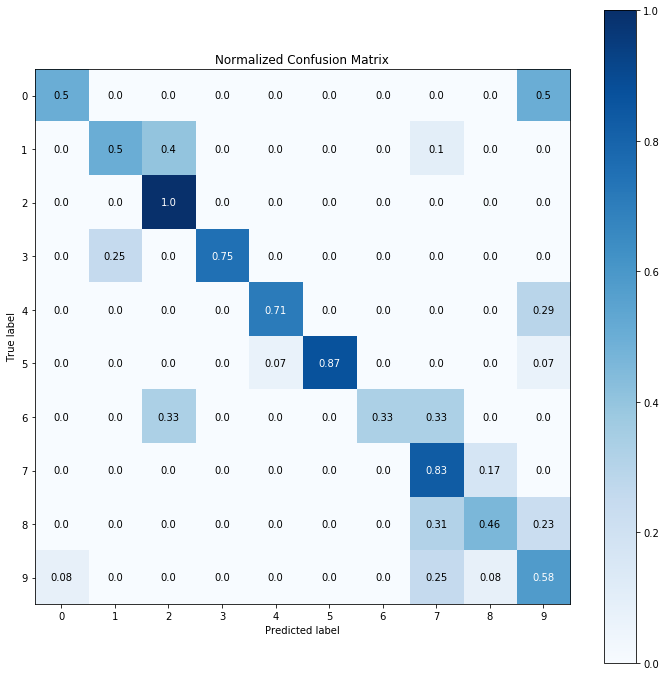

In [ ]:
import scikitplot as skplt

skplt.metrics.plot_confusion_matrix(y_test.argmax(axis=1), x_pred.argmax(axis=1), 
                                    figsize=(12,12), normalize=True)

- Model 3 is also good.
- but comaring with model 2 testing accuracy is low
- Model 2 3% better than model 3
- So model 2 is very good

<h2><font color='green'>Using Transfer Learning Models (VGG16,Resnet)

<h3><font color='green'>1) VGG16

In [ ]:
#https://keras.io/applications/#vgg16

from keras.applications import VGG16

vgg_conv = VGG16(weights='imagenet', include_top=False, input_shape=(150,150,3))

x = vgg_conv.output
x = MaxPooling2D()(x)
f = Flatten()(x)
x = Dense(50,activation='relu')(f)
d = Dropout(rate=0.5)(x)
preds = Dense(10,activation='softmax')(d) 

model4=Model(inputs=vgg_conv.input,outputs=preds)
vgg_conv.trainable=False

In [ ]:
model4.compile(optimizer=Optimizers.Adam(lr=0.0001),
               loss='categorical_crossentropy',
               metrics=[f1])

In [ ]:
check_point = keras.callbacks.ModelCheckpoint("model_4", monitor="val_loss", mode= "min", verbose= 1, save_best_only=True)

cb = [check_point]

In [ ]:
model4_history = model4.fit_generator(datagen_tr.flow(x_train, y_train, batch_size= 6),
                                      steps_per_epoch=len(x_train) / 6, epochs = 120,
                                      validation_data=(x_test, y_test),
                                      callbacks=cb)

Epoch 1/120
51/50 [==============================] - 34s 659ms/step - loss: 2.3003 - f1: 0.0056 - val_loss: 2.2337 - val_f1: 0.0000e+00

Epoch 00001: val_loss improved from inf to 2.23372, saving model to model_4
Epoch 2/120
51/50 [==============================] - 3s 55ms/step - loss: 2.2957 - f1: 0.0000e+00 - val_loss: 2.2350 - val_f1: 0.0000e+00

Epoch 00002: val_loss did not improve from 2.23372
Epoch 3/120
51/50 [==============================] - 3s 56ms/step - loss: 2.2446 - f1: 0.0000e+00 - val_loss: 2.2036 - val_f1: 0.0000e+00

Epoch 00003: val_loss improved from 2.23372 to 2.20364, saving model to model_4
Epoch 4/120
51/50 [==============================] - 3s 55ms/step - loss: 2.2582 - f1: 0.0000e+00 - val_loss: 2.1819 - val_f1: 0.0000e+00

Epoch 00004: val_loss improved from 2.20364 to 2.18192, saving model to model_4
Epoch 5/120
51/50 [==============================] - 3s 55ms/step - loss: 2.2698 - f1: 0.0000e+00 - val_loss: 2.1917 - val_f1: 0.0000e+00

Epoch 00005: val_los

In [ ]:
score1 = model4.evaluate(x_train, y_train, verbose=0) 
print('Train accuracy:', score1[1])

score2 = model4.evaluate(x_test, y_test, verbose=0) 
print('Test accuracy:', score2[1])

Train accuracy: 0.9456119945791901
Test accuracy: 0.7419800154574505


<h3><font color='green'>2) ResNet

In [ ]:
#https://keras.io/applications/#resnet

from keras.applications.resnet50 import ResNet50

res_conv = ResNet50(weights='imagenet', include_top=False, input_shape=(150,150,3))

x = res_conv.output
x = MaxPooling2D()(x)
f = Flatten()(x)
x = Dense(50,activation='relu')(f)
d = Dropout(rate=0.5)(x)
preds = Dense(10,activation='softmax')(d) 

model5 = Model(inputs=res_conv.input,outputs=preds)
res_conv.trainable=False

/usr/local/lib/python3.6/dist-packages/keras_applications/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


In [ ]:
model5.compile(optimizer=Optimizers.Adam(lr=0.0001),
               loss='categorical_crossentropy',
               metrics=[f1])

In [ ]:
check_point = keras.callbacks.ModelCheckpoint("model_5", monitor="val_loss", mode= "min", verbose= 1, save_best_only=True)

cb = [check_point]

In [ ]:
model5_history = model5.fit_generator(datagen_tr.flow(x_train, y_train, batch_size= 6),
                                      steps_per_epoch=len(x_train) / 6, epochs = 120,
                                      validation_data=(x_test, y_test),
                                      callbacks=cb)

Epoch 1/120
51/50 [==============================] - 5s 88ms/step - loss: 2.1016 - f1: 0.1071 - val_loss: 1.9766 - val_f1: 0.2223

Epoch 00001: val_loss improved from 2.12554 to 1.97656, saving model to model_5
Epoch 2/120
51/50 [==============================] - 4s 87ms/step - loss: 2.0585 - f1: 0.1755 - val_loss: 1.7863 - val_f1: 0.4165

Epoch 00002: val_loss improved from 1.97656 to 1.78630, saving model to model_5
Epoch 3/120
51/50 [==============================] - 4s 88ms/step - loss: 2.0274 - f1: 0.2163 - val_loss: 1.7271 - val_f1: 0.4051

Epoch 00003: val_loss improved from 1.78630 to 1.72707, saving model to model_5
Epoch 4/120
51/50 [==============================] - 5s 91ms/step - loss: 1.7936 - f1: 0.3143 - val_loss: 1.6218 - val_f1: 0.4443

Epoch 00004: val_loss improved from 1.72707 to 1.62182, saving model to model_5
Epoch 5/120
51/50 [==============================] - 4s 85ms/step - loss: 1.8799 - f1: 0.2809 - val_loss: 1.6621 - val_f1: 0.4964

Epoch 00005: val_loss did

In [ ]:
score1 = model5.evaluate(x_train, y_train, verbose=0) 
print('Train accuracy:', score1[1])

score2 = model5.evaluate(x_test, y_test, verbose=0) 
print('Test accuracy:', score2[1])

Train accuracy: 0.9852198522599017
Test accuracy: 0.6899275036601277


<h2><font color='green'>Predicting the test data

In [ ]:
print("The Predict Dataset Shape: ", x_test.shape)

print("The Predict Dataset Shape: ", y_test.shape)

The Predict Dataset Shape:  (77, 150, 150, 3)
The Predict Dataset Shape:  (77, 10)


In [ ]:
'''testing on test data and we can see f1 score'''
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score

x_pred = model2.predict_classes(x_test, verbose=1)
x_pred = np.array(x_pred)
x_pred = x_pred.reshape(x_pred.shape[0], 1)
x_pred = np_utils.to_categorical(x_pred, 10)

f1_score(y_test, x_pred, average='micro')

77/77 [==============================] - 0s 669us/sample


0.7142857142857143

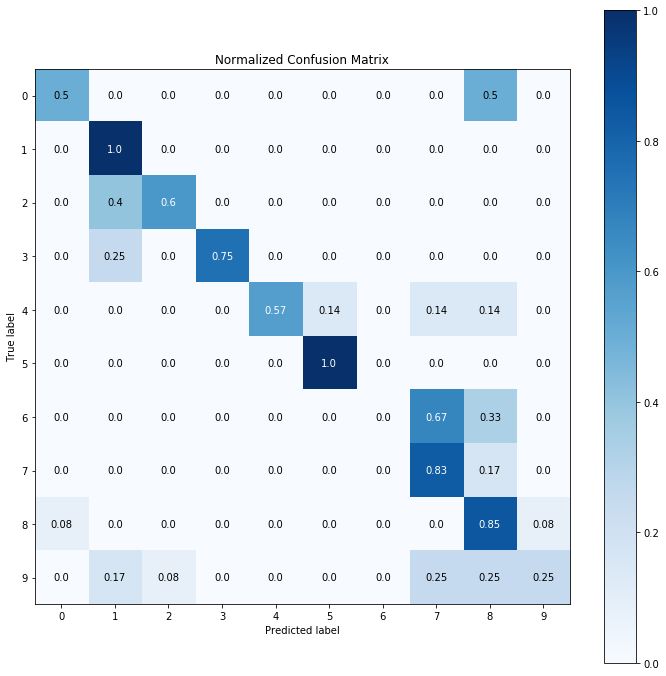

In [ ]:
import scikitplot as skplt

skplt.metrics.plot_confusion_matrix(y_test.argmax(axis=1), x_pred.argmax(axis=1), 
                                    figsize=(12,12), normalize=True)

In [ ]:
x_pred2 = model2.predict_classes(x_test, verbose=1)

77/77 [==============================] - 0s 639us/sample


In [ ]:
predict_labels = [] #''' used to store class label names '''
for i in x_pred2:
    if i == 0:
        predict_labels.append('Healthy')
    elif i == 1:
        predict_labels.append('Bacterial Blight')
    elif i == 2:
        predict_labels.append('Copper Phytotoxicity')
    elif i == 3:
        predict_labels.append('Mosaic Virus')
    elif i == 4:
        predict_labels.append('Downy Mildew')
    elif i == 5:
        predict_labels.append('Powdery Mildew')
    elif i == 6:
        predict_labels.append('Brown Spot')
    elif i == 7:
        predict_labels.append('Rust and target spot')
    elif i == 8:
        predict_labels.append('Rust')
    elif i == 9:
        predict_labels.append('Southern Blight')

<h2><font color='green'>Predicted images

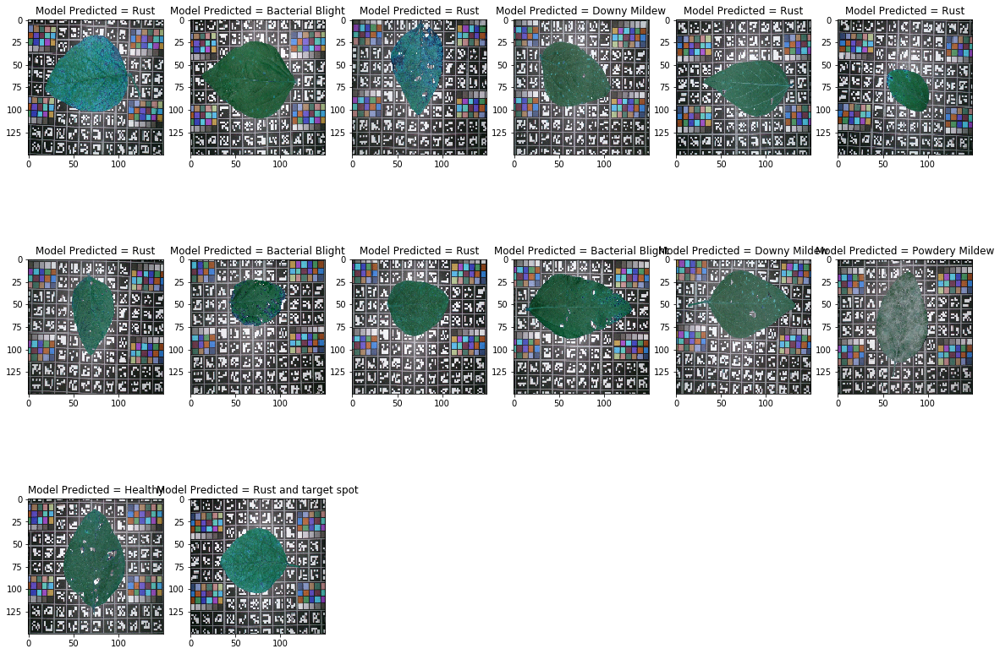

In [ ]:
''' printing the images with class labels '''

fig = plt.figure(figsize=(20,20)) 
for x in range(1, 15):
    ax = fig.add_subplot(4, 6, x)
    ax.set_title('Model Predicted = '+ predict_labels[x-1]) #''' printing the predict labels '''
    ax.imshow(x_test[x-1])    #''' printing the predicted images with labels '''

<h2><font color='orange'>Conclusion

In [ ]:
from prettytable import PrettyTable

x = PrettyTable()

x.field_names = ["Model" ,"Training accuracy", "Testing accuracy"] #''' we are printing train and test accuracy of the model'''
                
x.add_row([ "Model 1", "90.82%", "69.53%"]) # Basic Model 1 

x.add_row([ "Model 2", "84.21%", "74.91%"]) #Model 2 with Regularization(l2)

x.add_row([ "Model 3", "84.86%", "64.51%"]) #Model 3 with calculated weights

x.add_row([ "VGG16", "94.56%", "74.19%"]) #VGG16 Model

x.add_row([ "ResNet50", "98.52%", "68.99%"]) #ResNet50 Model


print(x)

+----------+-------------------+------------------+
|  Model   | Training accuracy | Testing accuracy |
+----------+-------------------+------------------+
| Model 1  |       90.82%      |      69.53%      |
| Model 2  |       84.21%      |      74.91%      |
| Model 3  |       84.86%      |      64.51%      |
|  VGG16   |       94.56%      |      74.19%      |
| ResNet50 |       98.52%      |      68.99%      |
+----------+-------------------+------------------+


<h3>Summary</h3>
- Firstly we taken our Soyabean dataset and loaded <br>
- We cropped the images.<br>
- after that we resize the height and width of the images into(150,150)<br>
- next we load the CNN model.<br>
- then we train our Soyabean dataset.<br>
- the Model 1 is overfitting.<br>
- so we added the regularization to Model 2.<br>
- Model 2 is pretty good on both train and test dataset.<br>
- now we added the weights to the Model 3.<br>
- Model 3 also good but testing accuracy is low compare to Model 2.<br>
- we test the test image dataset using Model 2.<br>
- then predicted classes on test images.<br>
- after that we seen images with predicted class labels.<br>